In [1]:
import os

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

from scipy.stats import skew

from sklearn.model_selection import KFold, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.base import clone

from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
import xgboost as xgb
from catboost import CatBoostRegressor
import lightgbm as lgb
from sklearn.ensemble import VotingRegressor

from sklearn.metrics import mean_squared_error

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
def score_outliers(data, perc1=25, perc3=75):
    q1 = np.percentile(data, perc1)
    q3 = np.percentile(data, perc3)
    iqr = q3 - q1
    outlier_low = q1 - 1.5*iqr
    outlier_high = q3 + 1.5*iqr
    return q1, q3, iqr, outlier_low, outlier_high

In [4]:
def error_metric_cv(model, X, y, scoring="neg_mean_squared_error", n_cv=5):
    kf = KFold(n_cv, shuffle=True).get_n_splits(X)
    rmse = cross_val_score(model, X, y, scoring=scoring, cv = kf)
    return rmse

In [5]:
def neg_error_metric_cv(model, X, y, scoring="neg_mean_squared_error", n_cv=5):
    return -error_metric_cv(model, X, y, scoring=scoring, n_cv=n_cv)

In [6]:
def models_cv_stat(models, X, y, scoring="neg_mean_squared_error", n_cv=5):
    stat_df = pd.DataFrame()
    stat_df['model'] = list(models.keys())
    scores = np.array([cross_val_score(m, X, y, cv=n_cv) for m in models.values()])
    stat_df['cv_score_mean'] = scores.mean(axis=-1)
    stat_df['cv_score_std'] = scores.std(axis=-1)
    scores = np.array([neg_error_metric_cv(m, X, y, scoring="neg_mean_squared_error", n_cv=n_cv) for m in models.values()])
    stat_df['rmsle_cv_score_mean'] = scores.mean(axis=-1)
    stat_df['rmsle_cv_score_std'] = scores.std(axis=-1)
    return stat_df

In [7]:
def models_pred_stat(models, X_train, y_train, X_test, y_test):
    stat_df = pd.DataFrame()
    stat_df['model'] = list(models.keys())
    for Xy_type, X, y in zip(['train', 'test'], [X_train, X_test], [y_train, y_test]):
        y_preds = [m.predict(X) for m in models.values()]
        stat_df['rmse_{}'.format(Xy_type)] = [
            np.sqrt(mean_squared_error(np.array(y), y_pred))
            for y_pred in y_preds
        ]
    return stat_df

# Reading src data

In [8]:
src_catalog = './house-prices-advanced-regression-techniques'

### train

In [9]:
train_file = os.path.join(src_catalog, 'train.csv')

In [10]:
train_df = pd.read_csv(train_file, sep=',')
train_df.shape

(1460, 81)

In [11]:
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [12]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [13]:
train_ids = list(train_df['Id'])
len(train_ids)

1460

<AxesSubplot:>

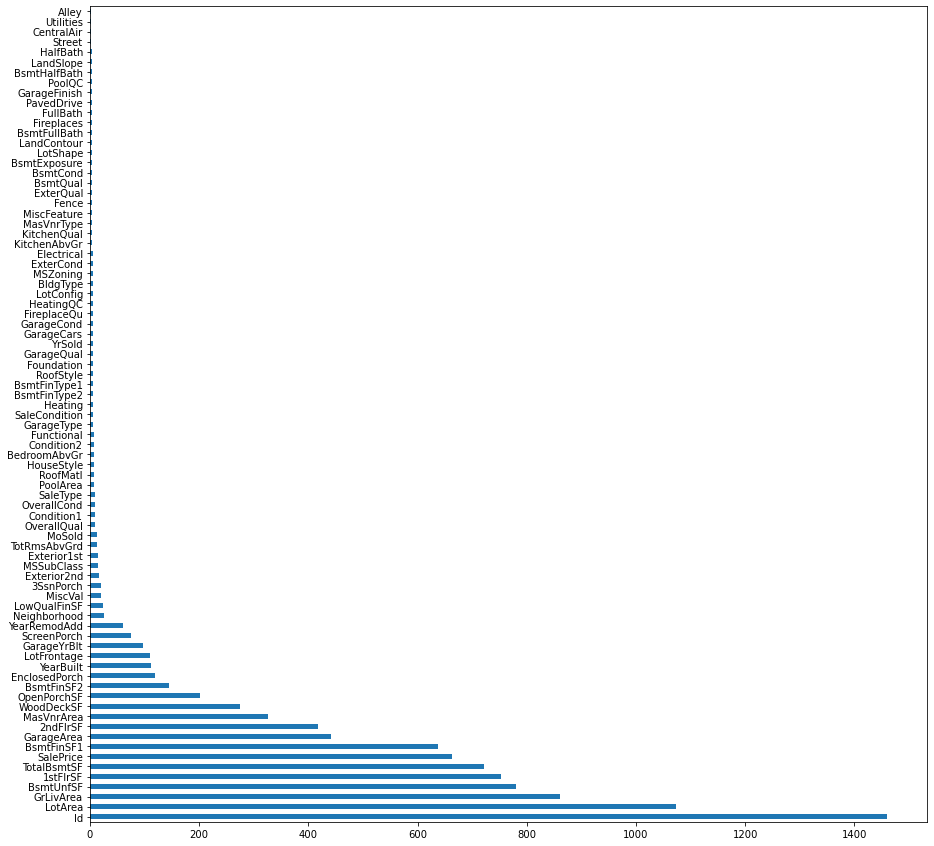

In [14]:
plt.figure(figsize=(15,15))
nunique_train_cols_s = train_df.nunique()
nunique_train_cols_s.sort_values(ascending=False).plot.barh()

In [15]:
not_cat_cols = [
    'Id',
    'LotFrontage',
    'LotArea',
    'MasVnrArea',
    'BsmtFinSF1',
    'BsmtFinSF2',
    'BsmtUnfSF', 
    'TotalBsmtSF',
    '1stFlrSF',
    '2ndFlrSF',
    'LowQualFinSF',
    'GrLivArea',
    'GarageArea',
    'WoodDeckSF',
    'OpenPorchSF',
    'EnclosedPorch',
    '3SsnPorch',
    'ScreenPorch',
    'PoolArea',
    'MiscVal',
    'SalePrice',
]
len(not_cat_cols)

21

In [16]:
plot_cols = list(train_df.columns.copy())
for col in not_cat_cols:
    plot_cols.remove(col)
len(plot_cols)

60

In [17]:
plot_cols[:5]

['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape']

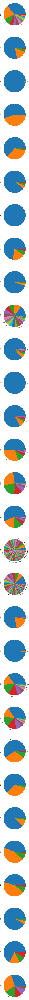

In [18]:
n_start = 0
n_stop = int(len(plot_cols) / 2)
fig, axes = plt.subplots(len(plot_cols[n_start:n_stop]), 1, figsize=(15,15 * (n_stop - n_start)))
for i, col in enumerate(plot_cols[n_start:n_stop]):
    train_df[col].value_counts().plot.pie(ax=axes[i])

<AxesSubplot:>

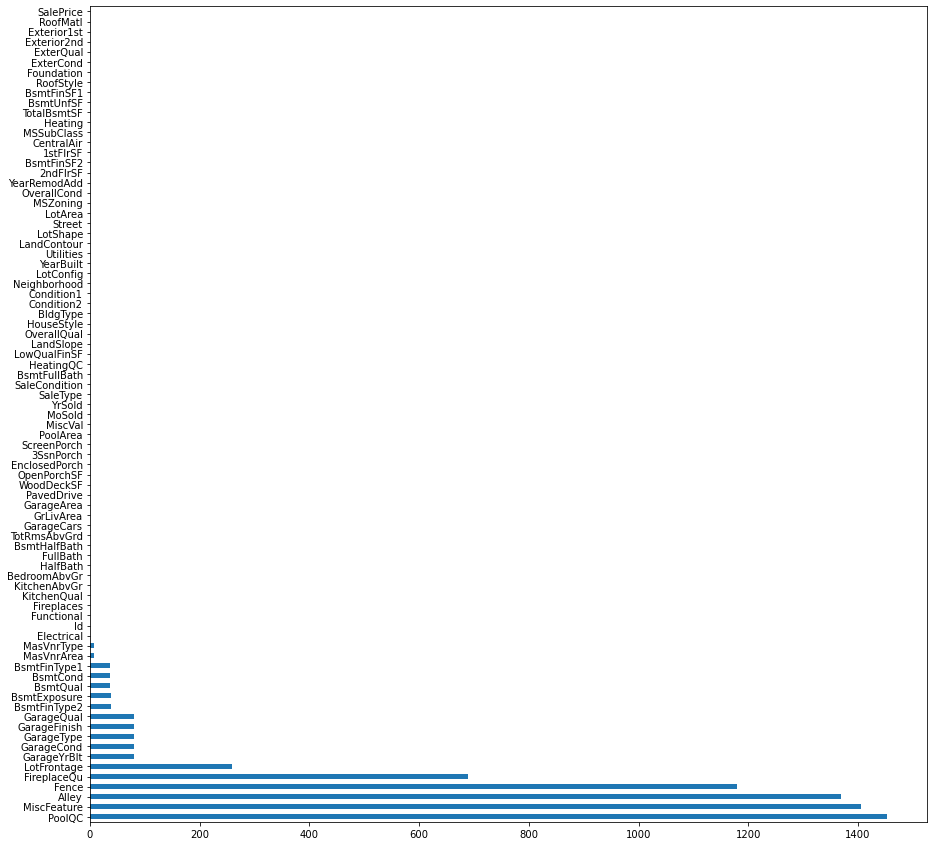

In [19]:
plt.figure(figsize=(15,15))
is_null_train_cols_s = train_df.isnull().sum()
is_null_train_cols_s.sort_values(ascending=False).plot.barh(x='cols', y='null_cnt')

In [20]:
not_null_train_cols = list(is_null_train_cols_s[is_null_train_cols_s == 0].index)
not_null_train_cols[:5]

['Id', 'MSSubClass', 'MSZoning', 'LotArea', 'Street']

In [21]:
len(not_null_train_cols)

62

In [22]:
null_train_cols = list(is_null_train_cols_s[is_null_train_cols_s != 0].sort_values(ascending=True).index)
null_train_cols[:5]

['Electrical', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond']

In [23]:
len(null_train_cols)

19

In [24]:
is_null_train_cols_s[null_train_cols]

Electrical         1
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtFinType1      37
BsmtExposure      38
BsmtFinType2      38
GarageCond        81
GarageQual        81
GarageFinish      81
GarageType        81
GarageYrBlt       81
LotFrontage      259
FireplaceQu      690
Fence           1179
Alley           1369
MiscFeature     1406
PoolQC          1453
dtype: int64

### test

In [25]:
test_file = os.path.join(src_catalog, 'test.csv')

In [26]:
test_df = pd.read_csv(test_file, sep=',')
test_df.shape

(1459, 80)

In [27]:
test_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [28]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

In [29]:
test_ids = list(test_df['Id'])
len(test_ids)

1459

<AxesSubplot:>

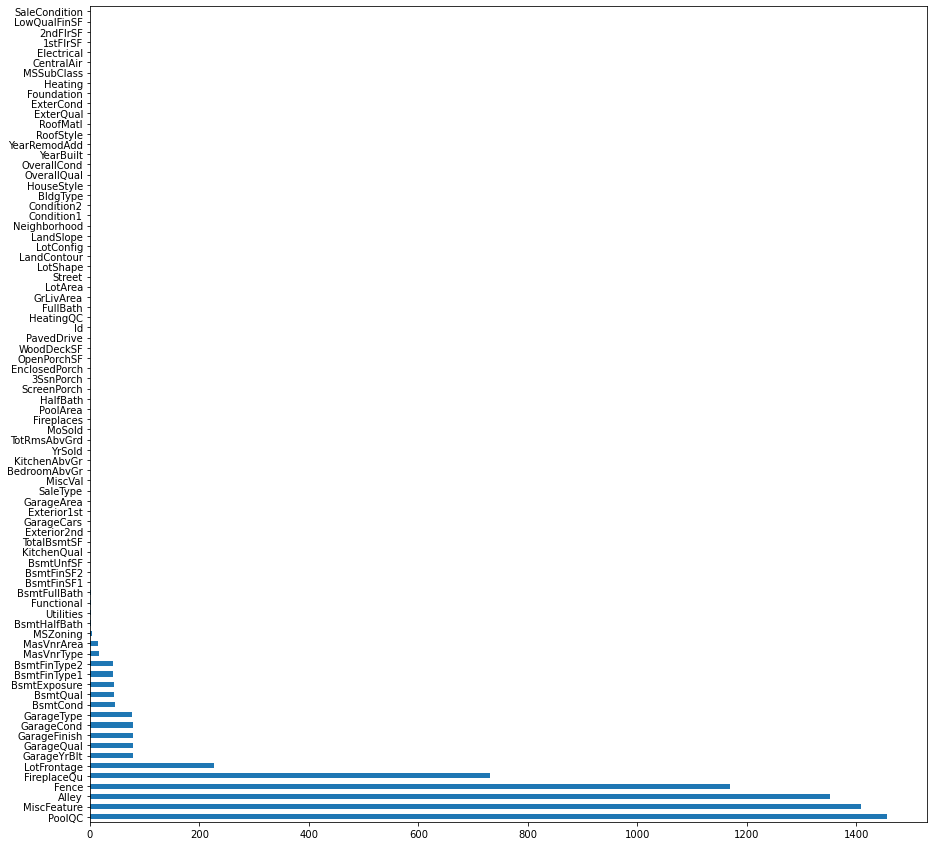

In [30]:
plt.figure(figsize=(15,15))
is_null_test_cols_s = test_df.isnull().sum()
is_null_test_cols_s.sort_values(ascending=False).plot.barh(x='cols', y='null_cnt')

In [31]:
not_null_test_cols = list(is_null_test_cols_s[is_null_test_cols_s == 0].index)
not_null_test_cols[:5]

['Id', 'MSSubClass', 'LotArea', 'Street', 'LotShape']

In [32]:
len(not_null_test_cols)

47

In [33]:
null_test_cols = list(is_null_test_cols_s[is_null_test_cols_s != 0].sort_values(ascending=True).index)
null_test_cols[:5]

['TotalBsmtSF', 'GarageArea', 'GarageCars', 'KitchenQual', 'BsmtUnfSF']

In [34]:
len(null_test_cols)

33

In [35]:
is_null_test_cols_s[null_test_cols]

TotalBsmtSF        1
GarageArea         1
GarageCars         1
KitchenQual        1
BsmtUnfSF          1
BsmtFinSF2         1
BsmtFinSF1         1
SaleType           1
Exterior1st        1
Exterior2nd        1
Functional         2
Utilities          2
BsmtHalfBath       2
BsmtFullBath       2
MSZoning           4
MasVnrArea        15
MasVnrType        16
BsmtFinType2      42
BsmtFinType1      42
BsmtQual          44
BsmtExposure      44
BsmtCond          45
GarageType        76
GarageFinish      78
GarageQual        78
GarageCond        78
GarageYrBlt       78
LotFrontage      227
FireplaceQu      730
Fence           1169
Alley           1352
MiscFeature     1408
PoolQC          1456
dtype: int64

# Analizing train data

### SalePrice

In [36]:
train_df['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

<AxesSubplot:>

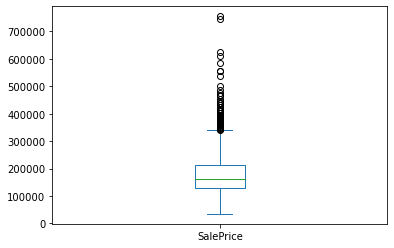

In [37]:
train_df['SalePrice'].plot.box()

<AxesSubplot:xlabel='SalePrice', ylabel='Count'>

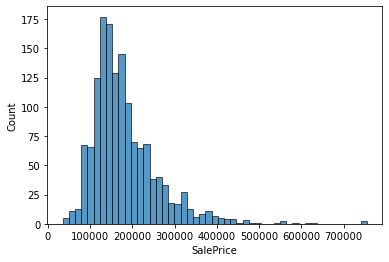

In [38]:
sns.histplot(train_df['SalePrice'])

# Filling null values

In [39]:
data_df = pd.concat([train_df, test_df], ignore_index=True)
data_df.pop('SalePrice')
data_df.shape

(2919, 80)

### NA values

In [40]:
na_cols = [
    'Alley',
    'BsmtQual',
    'BsmtCond',
    'BsmtExposure',
    'BsmtFinType1', 
    'BsmtFinType2', 
    'FireplaceQu', 
    'GarageType', 
    'GarageFinish', 
    'GarageQual',
    'GarageCond',
    'PoolQC',
    'Fence',
    'MiscFeature'
]

In [41]:
for col in na_cols:
    data_df[col].fillna('NA', inplace=True)

### Mode values

In [42]:
mode_cols = [
    'MSZoning',
    'Utilities',
    'Electrical',
    'SaleType',
    'KitchenQual',
    'Exterior1st',
    'Exterior2nd'
]

In [43]:
for col in mode_cols:
    data_df[col].fillna(data_df[col].mode()[0], inplace=True)

### Zero values

In [44]:
zero_cols = [
    'BsmtFinSF1',
    'BsmtFinSF2',
    'BsmtUnfSF',
    'TotalBsmtSF',
    'BsmtFullBath',
    'BsmtHalfBath',
    'GarageCars',
    'GarageArea',    
    'YearBuilt',
    'YearRemodAdd',
    'GarageYrBlt',
    'MoSold',
    'YrSold'
]

In [45]:
for col in zero_cols:
    data_df[col].fillna(0, inplace=True)

### MasVnr values

In [46]:
data_df['MasVnrType'].fillna('None', inplace=True)
data_df['MasVnrArea'].fillna(0, inplace=True)

### Functional value

In [47]:
data_df['Functional'].fillna('Typ', inplace=True)

### Numerical categorial values

In [48]:
num_to_cat_cols = [
    'MSSubClass',
    'OverallQual',
    'OverallCond'
]

In [49]:
for col in num_to_cat_cols:
    data_df[col] = data_df[col].astype('str')

In [50]:
for col in num_to_cat_cols:
    data_df[col].fillna('NA', inplace=True)

### Correlation

In [51]:
data_corr = data_df.corr()
data_corr.shape

(34, 34)

<AxesSubplot:>

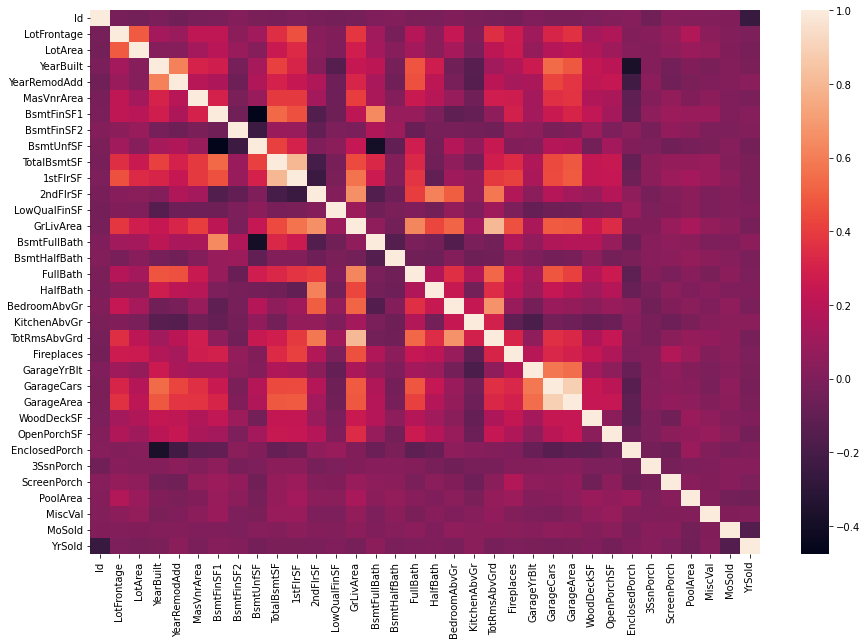

In [52]:
plt.subplots(figsize=(15,10))
sns.heatmap(data_corr)

### LotFrontage value

In [53]:
col='LotFrontage'

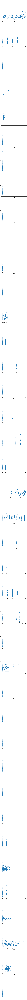

In [54]:
i1 = 0
i2 = int(len(data_df.columns) / 2)
fig, axes = plt.subplots(len(data_df.columns[i1:i2]), 1, figsize=(15,15*(i2-i1)))
for i, c in enumerate(data_df.columns[i1:i2]):
    data_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90)

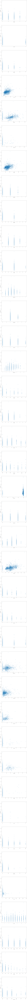

In [55]:
i1 = int(len(data_df.columns) / 2)
i2 = len(data_df.columns)
fig, axes = plt.subplots(len(data_df.columns[i1:i2]), 1, figsize=(15,15*(i2-i1)))
for i, c in enumerate(data_df.columns[i1:i2]):
    data_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90)

##### Skew

In [56]:
numeric_cols = data_df.dtypes[data_df.dtypes != "object"].index
skew_s = data_df[numeric_cols].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)
skew_s

MiscVal          21.947195
PoolArea         16.898328
LotArea          12.822431
LowQualFinSF     12.088761
3SsnPorch        11.376065
KitchenAbvGr      4.302254
BsmtFinSF2        4.146143
EnclosedPorch     4.003891
ScreenPorch       3.946694
BsmtHalfBath      3.931594
MasVnrArea        2.613592
OpenPorchSF       2.535114
WoodDeckSF        1.842433
LotFrontage       1.502351
1stFlrSF          1.469604
BsmtFinSF1        1.425230
GrLivArea         1.269358
TotalBsmtSF       1.156894
BsmtUnfSF         0.919339
2ndFlrSF          0.861675
TotRmsAbvGrd      0.758367
Fireplaces        0.733495
HalfBath          0.694566
BsmtFullBath      0.624832
BedroomAbvGr      0.326324
GarageArea        0.239257
MoSold            0.195884
FullBath          0.167606
YrSold            0.132399
Id                0.000000
GarageCars       -0.219581
YearRemodAdd     -0.451020
YearBuilt        -0.599806
GarageYrBlt      -3.906205
dtype: float64

In [57]:
skew_cols = list(skew_s[abs(skew_s) >= 0.45].index)
len(skew_cols)

27

In [58]:
skew_cols[:5]

['MiscVal', 'PoolArea', 'LotArea', 'LowQualFinSF', '3SsnPorch']

In [59]:
data_log1p_df = data_df.copy()
for skew_col in skew_cols:
    data_log1p_df[skew_col] = np.log1p(data_log1p_df[skew_col])
data_log1p_df.shape

(2919, 80)

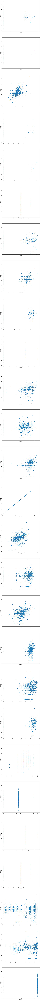

In [60]:
fig, axes = plt.subplots(len(skew_cols), 1, figsize=(15,15*len(skew_cols)))
for i, c in enumerate(skew_cols):
    data_log1p_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90)

##### Outliers

In [61]:
linear_cols = [
    'LotArea',
    'MasVnrArea',
    'BsmtFinSF1',
    'BsmtFinSF2',
    'BsmtUnfSF',
    'TotalBsmtSF',
    '1stFlrSF',
    '2ndFlrSF',
    'GrLivArea',
    'GarageArea',
    'WoodDeckSF',
    'OpenPorchSF'
]

In [62]:
linear_thresholds = dict()
for c in linear_cols + [col]:
    _, _, _, _, linear_thresholds[c] = score_outliers(train_df[c].dropna())
linear_thresholds[col]

111.5

In [63]:
data_thr_df = data_df.copy()
for c in linear_cols + [col]:
    data_thr_df = data_thr_df[data_thr_df[c] <= linear_thresholds[c]]
data_thr_df.shape

(1727, 80)

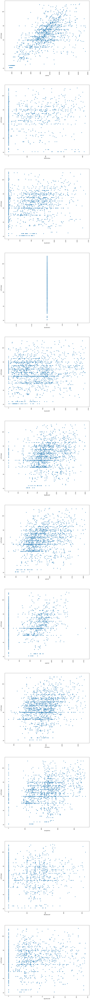

In [64]:
fig, axes = plt.subplots(len(linear_cols), 1, figsize=(15,15*len(linear_cols)))
for i, c in enumerate(linear_cols):
    data_thr_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90)

### Dummies

In [65]:
data_log1p_dummies_df = pd.get_dummies(data_log1p_df)
data_log1p_dummies_df.shape

(2919, 335)

In [66]:
data_log1p_thr_dummies_df = data_log1p_dummies_df[data_log1p_dummies_df['Id'].isin(data_thr_df['Id'])]
data_log1p_thr_dummies_df.shape

(1727, 335)

In [67]:
data_log1p_thr_dummies_df.head()

,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,1,4.189655,9.042040,7.602900,7.602900,5.283204,6.561031,0.0,5.017280,6.753438,...,0,0,0,1,0,0,0,0,1,0
1,2,4.394449,9.169623,7.589336,7.589336,0.000000,6.886532,0.0,5.652489,7.141245,...,0,0,0,1,0,0,0,0,1,0
2,3,4.234107,9.328212,7.601902,7.602401,5.093750,6.188264,0.0,6.075346,6.825460,...,0,0,0,1,0,0,0,0,1,0
3,4,4.110874,9.164401,7.557995,7.586296,0.000000,5.379897,0.0,6.293419,6.629363,...,0,0,0,1,1,0,0,0,0,0
4,5,4.442651,9.565284,7.601402,7.601402,5.860786,6.486161,0.0,6.196444,7.044033,...,0,0,0,1,0,0,0,0,1,0


In [68]:
data_log1p_thr_dummies_train_df = data_log1p_thr_dummies_df[data_log1p_thr_dummies_df[col].notnull()]
data_log1p_thr_dummies_train_df.shape

(1727, 335)

### Regression

In [69]:
X = data_log1p_thr_dummies_train_df.copy()
X.pop(col)
X.pop('Id')
y = data_log1p_thr_dummies_train_df[col]
X.shape, y.shape

((1727, 333), (1727,))

In [70]:
X_train, X_validation, y_train, y_validation = train_test_split(X, y, train_size=0.75, random_state=42)
X_train.shape, X_validation.shape, y_train.shape, y_validation.shape

((1295, 333), (432, 333), (1295,), (432,))

##### Ridge

In [71]:
ridge_model = Pipeline(steps=[('robast', RobustScaler()), ('ridge', KernelRidge(kernel='polynomial'))])

In [72]:
param_grid = {
    'ridge__alpha': [1, 0.1, 0.01, 0.001],
    'ridge__degree': range(2, 6),
}

ridge_grid_search = GridSearchCV(ridge_model, param_grid=param_grid, scoring='neg_mean_squared_error')

In [73]:
ridge_grid_search.fit(X_train, y_train)

GridSearchCV(estimator=Pipeline(steps=[('robast', RobustScaler()),
                                       ('ridge',
                                        KernelRidge(kernel='polynomial'))]),
             param_grid={'ridge__alpha': [1, 0.1, 0.01, 0.001],
                         'ridge__degree': range(2, 6)},
             scoring='neg_mean_squared_error')

In [74]:
ridge_grid_search.best_params_

{'ridge__alpha': 0.1, 'ridge__degree': 2}

In [75]:
ridge_grid_search.best_score_

-0.022993947511038802

In [76]:
alpha = ridge_grid_search.best_params_['ridge__alpha']
degree = ridge_grid_search.best_params_['ridge__degree']

ridge_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('ridge', KernelRidge(alpha=alpha, kernel='polynomial', degree=degree))
    ]
)
ridge_model

Pipeline(steps=[('robast', RobustScaler()),
                ('ridge',
                 KernelRidge(alpha=0.1, degree=2, kernel='polynomial'))])

##### Lasso

In [77]:
lasso_model = Pipeline(steps=[('robast', RobustScaler()), ('lasso', Lasso())])

In [78]:
param_grid = {
    'lasso__alpha': [1, 0.1, 0.01, 0.001],
}

lasso_grid_search = GridSearchCV(lasso_model, param_grid=param_grid, scoring='neg_mean_squared_error')

In [79]:
lasso_grid_search.fit(X_train, y_train)

GridSearchCV(estimator=Pipeline(steps=[('robast', RobustScaler()),
                                       ('lasso', Lasso())]),
             param_grid={'lasso__alpha': [1, 0.1, 0.01, 0.001]},
             scoring='neg_mean_squared_error')

In [80]:
lasso_grid_search.best_params_

{'lasso__alpha': 0.001}

In [81]:
lasso_grid_search.best_score_

-0.019965282855765848

In [82]:
alpha = lasso_grid_search.best_params_['lasso__alpha']

lasso_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('lasso', Lasso(alpha=alpha))
    ]
)
lasso_model

Pipeline(steps=[('robast', RobustScaler()), ('lasso', Lasso(alpha=0.001))])

##### ElasticNet

In [83]:
enet_model = Pipeline(steps=[('robast', RobustScaler()), ('enet', ElasticNet())])

In [84]:
param_grid = {
    'enet__alpha': [1, 0.1, 0.01, 0.001],
    'enet__l1_ratio': [0.01, 0.1, 0.5, 0.75]
}

enet_grid_search = GridSearchCV(enet_model, param_grid=param_grid, scoring='neg_mean_squared_error')

In [85]:
enet_grid_search.fit(X_train, y_train)

GridSearchCV(estimator=Pipeline(steps=[('robast', RobustScaler()),
                                       ('enet', ElasticNet())]),
             param_grid={'enet__alpha': [1, 0.1, 0.01, 0.001],
                         'enet__l1_ratio': [0.01, 0.1, 0.5, 0.75]},
             scoring='neg_mean_squared_error')

In [86]:
enet_grid_search.best_params_

{'enet__alpha': 0.001, 'enet__l1_ratio': 0.5}

In [87]:
enet_grid_search.best_score_

-0.019762661773060585

In [88]:
alpha = enet_grid_search.best_params_['enet__alpha']
l1_ratio = enet_grid_search.best_params_['enet__l1_ratio']

enet_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('enet', ElasticNet(alpha=alpha, l1_ratio=l1_ratio))
    ]
)
enet_model

Pipeline(steps=[('robast', RobustScaler()), ('enet', ElasticNet(alpha=0.001))])

##### Random Forest

In [89]:
max_depth = 7
n_estimators = 1000

rf_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('rf', RandomForestRegressor(max_depth=max_depth, n_estimators=n_estimators))
    ]
)
rf_model

Pipeline(steps=[('robast', RobustScaler()),
                ('rf', RandomForestRegressor(max_depth=7, n_estimators=1000))])

##### GradientBoostingRegressor

In [90]:
learning_rate=0.001
max_depth=5
n_estimators=2000


gbr_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('gbr', GradientBoostingRegressor(
            loss='huber',
            learning_rate=learning_rate, 
            max_depth=max_depth, 
            n_estimators=n_estimators)
        )
    ]
)
gbr_model

Pipeline(steps=[('robast', RobustScaler()),
                ('gbr',
                 GradientBoostingRegressor(learning_rate=0.001, loss='huber',
                                           max_depth=5, n_estimators=2000))])

##### XGBoost

In [91]:
xgb_model = xgb.XGBRegressor(
    eval_metrics='rmse', n_estimators=5000, max_depth=5, eta=0.01, gamma=0.5,
    verbosity=0
)
xgb_model

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eta=0.01, eval_metric=None,
             eval_metrics='rmse', feature_types=None, gamma=0.5, gpu_id=None,
             grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=5000, n_jobs=None, num_parallel_tree=None, ...)

##### CatBoost

In [92]:
cb_model = CatBoostRegressor(
    depth=3,
    learning_rate=0.05,
    reg_lambda = 35.0,
    logging_level='Silent',
    iterations=5000,
    loss_function='MAE',
    early_stopping_rounds=100,
)

##### LightGBM

In [93]:
lgb_model = lgb.LGBMRegressor(
    boosting_type='gbdt', n_estimators=5000, max_depth=3, num_leaves=6, min_child_samples=3,
    learning_rate=0.01, reg_alpha=0.0, reg_lambda=0.5
)

##### Models statistics

In [94]:
models = {
    'Ridge': ridge_model,
    'Lasso': lasso_model,
    'Elastic Net': enet_model,
    'Random Forest': rf_model,
    'Gradient Boosting Regressor': gbr_model,
    'XGBoost': xgb_model,
    'CatBoost': cb_model,
    'LightGBM': lgb_model
}

In [95]:
prep_models = dict()
for m_name, m in models.items():
    prep_models[m_name] = clone(m)
    if m_name == 'XGBoost':
        prep_models[m_name].fit(
            X_train, y_train,
            eval_set=[(X_train, y_train), (X_validation, y_validation)],
            early_stopping_rounds=100,
#             verbose=True
        )
    elif m_name =='CatBoost':
        prep_models[m_name].fit(
            X_train, y_train,
            eval_set=(X_validation, y_validation),
#             logging_level='Verbose',
            plot=False
        )
    elif m_name =='LightGBM':
        prep_models[m_name].fit(
            X_train, y_train,
            eval_set=(X_validation, y_validation),
            eval_metric='rmse',
            early_stopping_rounds=100,
            verbose=False
        )
    else:
        prep_models[m_name].fit(X_train, y_train)

[0]	validation_0-rmse:3.62170	validation_1-rmse:3.61720
[1]	validation_0-rmse:3.58566	validation_1-rmse:3.58111
[2]	validation_0-rmse:3.54998	validation_1-rmse:3.54538
[3]	validation_0-rmse:3.51466	validation_1-rmse:3.51000
[4]	validation_0-rmse:3.47969	validation_1-rmse:3.47499
[5]	validation_0-rmse:3.44508	validation_1-rmse:3.44032
[6]	validation_0-rmse:3.41080	validation_1-rmse:3.40600
[7]	validation_0-rmse:3.37688	validation_1-rmse:3.37202
[8]	validation_0-rmse:3.34329	validation_1-rmse:3.33839
[9]	validation_0-rmse:3.31004	validation_1-rmse:3.30509
[10]	validation_0-rmse:3.27712	validation_1-rmse:3.27213
[11]	validation_0-rmse:3.24453	validation_1-rmse:3.23949
[12]	validation_0-rmse:3.21227	validation_1-rmse:3.20719
[13]	validation_0-rmse:3.18033	validation_1-rmse:3.17520
[14]	validation_0-rmse:3.14870	validation_1-rmse:3.14355
[15]	validation_0-rmse:3.11739	validation_1-rmse:3.11221
[16]	validation_0-rmse:3.08640	validation_1-rmse:3.08118
[17]	validation_0-rmse:3.05572	validation

[144]	validation_0-rmse:0.86976	validation_1-rmse:0.86679
[145]	validation_0-rmse:0.86134	validation_1-rmse:0.85844
[146]	validation_0-rmse:0.85303	validation_1-rmse:0.85017
[147]	validation_0-rmse:0.84478	validation_1-rmse:0.84195
[148]	validation_0-rmse:0.83662	validation_1-rmse:0.83382
[149]	validation_0-rmse:0.82855	validation_1-rmse:0.82580
[150]	validation_0-rmse:0.82055	validation_1-rmse:0.81783
[151]	validation_0-rmse:0.81264	validation_1-rmse:0.81000
[152]	validation_0-rmse:0.80481	validation_1-rmse:0.80219
[153]	validation_0-rmse:0.79706	validation_1-rmse:0.79447
[154]	validation_0-rmse:0.78938	validation_1-rmse:0.78682
[155]	validation_0-rmse:0.78179	validation_1-rmse:0.77925
[156]	validation_0-rmse:0.77428	validation_1-rmse:0.77178
[157]	validation_0-rmse:0.76686	validation_1-rmse:0.76439
[158]	validation_0-rmse:0.75949	validation_1-rmse:0.75706
[159]	validation_0-rmse:0.75220	validation_1-rmse:0.74980
[160]	validation_0-rmse:0.74498	validation_1-rmse:0.74261
[161]	validati

[285]	validation_0-rmse:0.25132	validation_1-rmse:0.26013
[286]	validation_0-rmse:0.24956	validation_1-rmse:0.25844
[287]	validation_0-rmse:0.24785	validation_1-rmse:0.25683
[288]	validation_0-rmse:0.24613	validation_1-rmse:0.25521
[289]	validation_0-rmse:0.24447	validation_1-rmse:0.25365
[290]	validation_0-rmse:0.24279	validation_1-rmse:0.25205
[291]	validation_0-rmse:0.24117	validation_1-rmse:0.25053
[292]	validation_0-rmse:0.23957	validation_1-rmse:0.24903
[293]	validation_0-rmse:0.23797	validation_1-rmse:0.24755
[294]	validation_0-rmse:0.23638	validation_1-rmse:0.24603
[295]	validation_0-rmse:0.23484	validation_1-rmse:0.24460
[296]	validation_0-rmse:0.23332	validation_1-rmse:0.24318
[297]	validation_0-rmse:0.23181	validation_1-rmse:0.24174
[298]	validation_0-rmse:0.23033	validation_1-rmse:0.24036
[299]	validation_0-rmse:0.22887	validation_1-rmse:0.23901
[300]	validation_0-rmse:0.22740	validation_1-rmse:0.23764
[301]	validation_0-rmse:0.22596	validation_1-rmse:0.23627
[302]	validati

[427]	validation_0-rmse:0.14802	validation_1-rmse:0.16611
[428]	validation_0-rmse:0.14785	validation_1-rmse:0.16597
[429]	validation_0-rmse:0.14769	validation_1-rmse:0.16583
[430]	validation_0-rmse:0.14753	validation_1-rmse:0.16570
[431]	validation_0-rmse:0.14737	validation_1-rmse:0.16556
[432]	validation_0-rmse:0.14719	validation_1-rmse:0.16542
[433]	validation_0-rmse:0.14698	validation_1-rmse:0.16526
[434]	validation_0-rmse:0.14683	validation_1-rmse:0.16513
[435]	validation_0-rmse:0.14668	validation_1-rmse:0.16501
[436]	validation_0-rmse:0.14654	validation_1-rmse:0.16489
[437]	validation_0-rmse:0.14640	validation_1-rmse:0.16477
[438]	validation_0-rmse:0.14626	validation_1-rmse:0.16466
[439]	validation_0-rmse:0.14612	validation_1-rmse:0.16455
[440]	validation_0-rmse:0.14599	validation_1-rmse:0.16443
[441]	validation_0-rmse:0.14586	validation_1-rmse:0.16433
[442]	validation_0-rmse:0.14573	validation_1-rmse:0.16422
[443]	validation_0-rmse:0.14561	validation_1-rmse:0.16412
[444]	validati

[569]	validation_0-rmse:0.13978	validation_1-rmse:0.15955
[570]	validation_0-rmse:0.13977	validation_1-rmse:0.15954
[571]	validation_0-rmse:0.13976	validation_1-rmse:0.15954
[572]	validation_0-rmse:0.13975	validation_1-rmse:0.15953
[573]	validation_0-rmse:0.13974	validation_1-rmse:0.15952
[574]	validation_0-rmse:0.13973	validation_1-rmse:0.15952
[575]	validation_0-rmse:0.13972	validation_1-rmse:0.15951
[576]	validation_0-rmse:0.13971	validation_1-rmse:0.15951
[577]	validation_0-rmse:0.13970	validation_1-rmse:0.15950
[578]	validation_0-rmse:0.13969	validation_1-rmse:0.15949
[579]	validation_0-rmse:0.13969	validation_1-rmse:0.15949
[580]	validation_0-rmse:0.13968	validation_1-rmse:0.15948
[581]	validation_0-rmse:0.13967	validation_1-rmse:0.15948
[582]	validation_0-rmse:0.13966	validation_1-rmse:0.15947
[583]	validation_0-rmse:0.13965	validation_1-rmse:0.15947
[584]	validation_0-rmse:0.13965	validation_1-rmse:0.15946
[585]	validation_0-rmse:0.13964	validation_1-rmse:0.15946
[586]	validati

[711]	validation_0-rmse:0.13929	validation_1-rmse:0.15930
[712]	validation_0-rmse:0.13929	validation_1-rmse:0.15930
[713]	validation_0-rmse:0.13929	validation_1-rmse:0.15930
[714]	validation_0-rmse:0.13929	validation_1-rmse:0.15930
[715]	validation_0-rmse:0.13929	validation_1-rmse:0.15930
[716]	validation_0-rmse:0.13929	validation_1-rmse:0.15930
[717]	validation_0-rmse:0.13929	validation_1-rmse:0.15930
[718]	validation_0-rmse:0.13929	validation_1-rmse:0.15930
[719]	validation_0-rmse:0.13929	validation_1-rmse:0.15930
[720]	validation_0-rmse:0.13929	validation_1-rmse:0.15930
[721]	validation_0-rmse:0.13929	validation_1-rmse:0.15930
[722]	validation_0-rmse:0.13929	validation_1-rmse:0.15930
[723]	validation_0-rmse:0.13929	validation_1-rmse:0.15930
[724]	validation_0-rmse:0.13929	validation_1-rmse:0.15930
[725]	validation_0-rmse:0.13929	validation_1-rmse:0.15930
[726]	validation_0-rmse:0.13929	validation_1-rmse:0.15930
[727]	validation_0-rmse:0.13929	validation_1-rmse:0.15930
[728]	validati

In [96]:
models_pred_stat(prep_models, X_train, y_train, X_validation, y_validation)

,model,rmse_train,rmse_test
0,Ridge,0.108020,0.159055
1,Lasso,0.129924,0.149523
2,Elastic Net,0.124662,0.147756
3,Random Forest,0.100752,0.148795
4,Gradient Boosting Regressor,0.115157,0.154700
5,XGBoost,0.139297,0.159298
6,CatBoost,0.107858,0.142752
7,LightGBM,0.092482,0.139841


##### VotingRegressor

In [97]:
models = {
    'Ridge': ridge_model,
    'Lasso': lasso_model,
    'Elastic Net': enet_model,
    'Random Forest': rf_model,
    'Gradient Boosting Regressor': gbr_model,
    'XGBoost': xgb_model,
    'CatBoost': cb_model,
    'LightGBM': lgb_model
}

In [98]:
vr_model = VotingRegressor(estimators=[(m_name, m) for m_name, m in models.items()])

In [99]:
prep_vr_model = clone(vr_model)
prep_vr_model.fit(X_train, y_train)

VotingRegressor(estimators=[('Ridge',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('ridge',
                                              KernelRidge(alpha=0.1, degree=2,
                                                          kernel='polynomial'))])),
                            ('Lasso',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('lasso', Lasso(alpha=0.001))])),
                            ('Elastic Net',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('enet',
                                              ElasticNet(alpha=0.001))])),
                            ('Random Forest',
                             Pipeline(steps=...
                                          max_delta_step=None, max_depth=5,
                                          max_leaves=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=5000, n_jobs=None,
                                          num_parallel_tree=None, ...)),
                            ('CatBoost',
                             <catboost.core.CatBoostRegressor object at 0x00000186592C9760>),
                            ('LightGBM',
                             LGBMRegressor(learning_rate=0.01, max_depth=3,
                                           min_child_samples=3,
                                           n_estimators=5000, num_leaves=6,
                                           reg_lambda=0.5))])

In [100]:
models_pred_stat({'Voting': prep_vr_model}, X_train, y_train, X_validation, y_validation)

,model,rmse_train,rmse_test
0,Voting,0.101009,0.143523


##### Predicting

In [101]:
prep_vr_model = clone(vr_model)
prep_vr_model.fit(X, y)

VotingRegressor(estimators=[('Ridge',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('ridge',
                                              KernelRidge(alpha=0.1, degree=2,
                                                          kernel='polynomial'))])),
                            ('Lasso',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('lasso', Lasso(alpha=0.001))])),
                            ('Elastic Net',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('enet',
                                              ElasticNet(alpha=0.001))])),
                            ('Random Forest',
                             Pipeline(steps=...
                                          max_delta_step=None, max_depth=5,
                                          max_leaves=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=5000, n_jobs=None,
                                          num_parallel_tree=None, ...)),
                            ('CatBoost',
                             <catboost.core.CatBoostRegressor object at 0x0000018658CD8DF0>),
                            ('LightGBM',
                             LGBMRegressor(learning_rate=0.01, max_depth=3,
                                           min_child_samples=3,
                                           n_estimators=5000, num_leaves=6,
                                           reg_lambda=0.5))])

In [102]:
data_log1p_null_dummies_df = data_log1p_dummies_df[data_log1p_dummies_df[col].isnull()]
data_log1p_null_dummies_df.shape

(486, 335)

In [103]:
data_log1p_null_dummies_df.head()

,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
7,8,NaN,9.247925,7.587817,7.587817,5.484797,6.756932,3.496508,5.379897,7.010312,...,0,0,0,1,0,0,0,0,1,0
12,13,NaN,9.470317,7.582229,7.582229,0.000000,6.603944,0.000000,5.170484,6.816736,...,0,0,0,1,0,0,0,0,1,0
14,15,NaN,9.298443,7.581210,7.581210,5.361292,6.598509,0.000000,6.255750,7.134094,...,0,0,0,1,0,0,0,0,1,0
16,17,NaN,9.327412,7.586296,7.586296,5.198497,6.361302,0.000000,6.056784,6.912743,...,0,0,0,1,0,0,0,0,1,0
24,25,NaN,9.017605,7.585281,7.601902,0.000000,5.241747,6.505784,5.323010,6.966967,...,0,0,0,1,0,0,0,0,1,0


In [104]:
X_test = data_log1p_null_dummies_df.copy()
X_test.pop(col)
X_test.pop('Id')
y_test = data_log1p_null_dummies_df[col]
X_test.shape, y_test.shape

((486, 333), (486,))

In [105]:
y_pred = prep_vr_model.predict(X_test)

In [106]:
y_pred[:10]

array([4.46086517, 4.18727625, 4.45264788, 4.00902023, 4.22974737,
       4.03313665, 3.99830498, 3.95315687, 4.30013239, 4.33672342])

In [107]:
y_expm1_pred = np.expm1(y_pred)
y_expm1_pred[:10]

array([85.56236769, 64.8432063 , 84.85397422, 54.09286558, 67.69987414,
       55.4376591 , 53.50568365, 51.09957896, 72.70955183, 75.45661232])

In [108]:
data_log1p_null_dummies_df[col] = y_pred

In [109]:
ind_cols = data_log1p_null_dummies_df.get([col]).to_dict()[col]
len(ind_cols)

486

In [110]:
for ind, v in ind_cols.items():
    data_log1p_dummies_df.at[ind, col] = round(v)

In [111]:
col = 'LotFrontage'
data_log1p_dummies_df.isnull().sum()[col]

0

<AxesSubplot:ylabel='Frequency'>

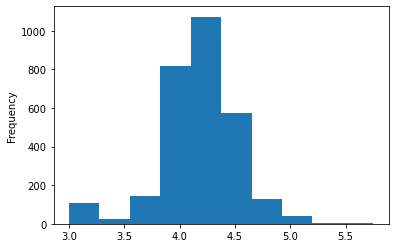

In [112]:
data_log1p_dummies_df[col].plot.hist()

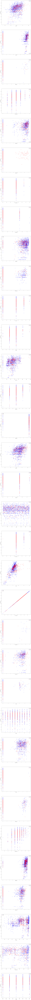

In [113]:
cols = np.intersect1d(data_log1p_thr_dummies_df.columns, data_df.columns)
i1 = 0
i2 = len(cols)
fig, axes = plt.subplots(len(cols[i1:i2]), 1, figsize=(15,15*(i2-i1)))
for i, c in enumerate(cols[i1:i2]):
    data_log1p_thr_dummies_train_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90, color='blue', label='train')
    data_log1p_null_dummies_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90, color='red', label='test')

# SalePrice predict

In [114]:
col = 'SalePrice'

In [115]:
data_log1p_dummies_sp_df = data_log1p_dummies_df.copy()
data_log1p_dummies_sp_df = pd.merge(data_log1p_dummies_sp_df, train_df.get(['Id', col]), how='left', on='Id')
data_log1p_dummies_sp_df[col] = np.log1p(data_log1p_dummies_sp_df[col])
data_log1p_dummies_sp_df.shape

(2919, 336)

In [116]:
data_log1p_dummies_sp_train_df = data_log1p_dummies_sp_df[data_df['Id'].isin(train_ids)]
data_log1p_dummies_sp_train_df.shape

(1460, 336)

In [117]:
data_log1p_dummies_sp_train_df.head()

,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,SalePrice
0,1,4.189655,9.042040,7.602900,7.602900,5.283204,6.561031,0.0,5.017280,6.753438,...,0,0,1,0,0,0,0,1,0,12.247699
1,2,4.394449,9.169623,7.589336,7.589336,0.000000,6.886532,0.0,5.652489,7.141245,...,0,0,1,0,0,0,0,1,0,12.109016
2,3,4.234107,9.328212,7.601902,7.602401,5.093750,6.188264,0.0,6.075346,6.825460,...,0,0,1,0,0,0,0,1,0,12.317171
3,4,4.110874,9.164401,7.557995,7.586296,0.000000,5.379897,0.0,6.293419,6.629363,...,0,0,1,1,0,0,0,0,0,11.849405
4,5,4.442651,9.565284,7.601402,7.601402,5.860786,6.486161,0.0,6.196444,7.044033,...,0,0,1,0,0,0,0,1,0,12.429220


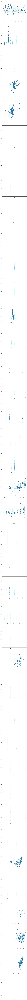

In [118]:
i1 = 0
i2 = int(len(train_df.columns) / 2)
# i2 = len(train_df.cumns)
fig, axes = plt.subplots(len(train_df.columns[i1:i2]), 1, figsize=(15,15*(i2-i1)))
for i, c in enumerate(train_df.columns[i1:i2]):
    if c in data_log1p_dummies_sp_train_df.columns:        
        data_log1p_dummies_sp_train_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90)
    else:
        train_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90)

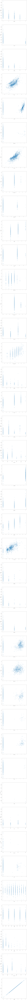

In [119]:
i1 = int(len(train_df.columns) / 2)
i2 = len(train_df.columns)
# i2 = len(train_df.columns)
fig, axes = plt.subplots(len(train_df.columns[i1:i2]), 1, figsize=(15,15*(i2-i1)))
for i, c in enumerate(train_df.columns[i1:i2]):
    if c in data_log1p_dummies_sp_train_df.columns:        
        data_log1p_dummies_sp_train_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90)
    else:
        train_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90)

##### Outliers

In [120]:
linear_cols = [
    'LotFrontage',
    'LotArea',
    'MasVnrArea',
    'BsmtFinSF1',
    'BsmtFinSF2',
    'BsmtUnfSF',
    'TotalBsmtSF',
    '1stFlrSF',
    '2ndFlrSF',
    'GrLivArea',
    'GarageArea',
    'WoodDeckSF',
    'OpenPorchSF'
]

In [121]:
linear_thresholds = dict()
for c in linear_cols + [col]:
    _, _, _, _, linear_thresholds[c] = score_outliers(data_log1p_dummies_sp_train_df[c].dropna())
linear_thresholds[col]

13.02168235497344

In [122]:
data_thr_df = data_log1p_dummies_sp_train_df.copy()
for c in linear_cols + [col]:
    data_thr_df = data_thr_df[data_thr_df[c] <= linear_thresholds[c]]
data_thr_df.shape

(1225, 336)

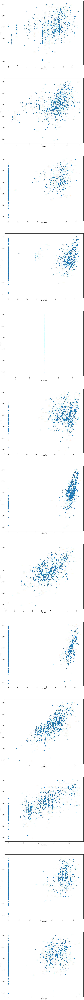

In [123]:
fig, axes = plt.subplots(len(linear_cols), 1, figsize=(15,15*len(linear_cols)))
for i, c in enumerate(linear_cols):
    data_thr_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90)

### Dummies

In [124]:
data_log1p_thr_dummies_sp_train_df = data_log1p_dummies_sp_train_df[data_log1p_dummies_sp_train_df['Id'].isin(data_thr_df['Id'])]
data_log1p_thr_dummies_sp_train_df.shape

(1225, 336)

In [125]:
data_log1p_thr_dummies_sp_train_df.head()

,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,SalePrice
0,1,4.189655,9.042040,7.602900,7.602900,5.283204,6.561031,0.0,5.017280,6.753438,...,0,0,1,0,0,0,0,1,0,12.247699
1,2,4.394449,9.169623,7.589336,7.589336,0.000000,6.886532,0.0,5.652489,7.141245,...,0,0,1,0,0,0,0,1,0,12.109016
2,3,4.234107,9.328212,7.601902,7.602401,5.093750,6.188264,0.0,6.075346,6.825460,...,0,0,1,0,0,0,0,1,0,12.317171
3,4,4.110874,9.164401,7.557995,7.586296,0.000000,5.379897,0.0,6.293419,6.629363,...,0,0,1,1,0,0,0,0,0,11.849405
4,5,4.442651,9.565284,7.601402,7.601402,5.860786,6.486161,0.0,6.196444,7.044033,...,0,0,1,0,0,0,0,1,0,12.429220


### Regression

In [126]:
X = data_log1p_thr_dummies_sp_train_df.copy()
X.pop(col)
X.pop('Id')
y = data_log1p_thr_dummies_sp_train_df[col]
X.shape, y.shape

((1225, 334), (1225,))

In [127]:
X_train, X_validation, y_train, y_validation = train_test_split(X, y, train_size=0.75, random_state=42)
X_train.shape, X_validation.shape, y_train.shape, y_validation.shape

((918, 334), (307, 334), (918,), (307,))

##### Ridge

In [128]:
ridge_model = Pipeline(steps=[('robast', RobustScaler()), ('ridge', KernelRidge(kernel='polynomial'))])

In [129]:
param_grid = {
    'ridge__alpha': [1, 0.1, 0.01, 0.001],
    'ridge__degree': range(2, 6),
}

ridge_grid_search = GridSearchCV(ridge_model, param_grid=param_grid, scoring='neg_mean_squared_error')

In [130]:
ridge_grid_search.fit(X_train, y_train)

GridSearchCV(estimator=Pipeline(steps=[('robast', RobustScaler()),
                                       ('ridge',
                                        KernelRidge(kernel='polynomial'))]),
             param_grid={'ridge__alpha': [1, 0.1, 0.01, 0.001],
                         'ridge__degree': range(2, 6)},
             scoring='neg_mean_squared_error')

In [131]:
ridge_grid_search.best_params_

{'ridge__alpha': 0.1, 'ridge__degree': 2}

In [132]:
ridge_grid_search.best_score_

-0.017737267231911377

In [133]:
alpha = ridge_grid_search.best_params_['ridge__alpha']
degree = ridge_grid_search.best_params_['ridge__degree']

ridge_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('ridge', KernelRidge(alpha=alpha, kernel='polynomial', degree=degree))
    ]
)
ridge_model

Pipeline(steps=[('robast', RobustScaler()),
                ('ridge',
                 KernelRidge(alpha=0.1, degree=2, kernel='polynomial'))])

##### Lasso

In [134]:
lasso_model = Pipeline(steps=[('robast', RobustScaler()), ('lasso', Lasso())])

In [135]:
param_grid = {
    'lasso__alpha': [1, 0.1, 0.01, 0.001],
}

lasso_grid_search = GridSearchCV(lasso_model, param_grid=param_grid, scoring='neg_mean_squared_error')

In [136]:
lasso_grid_search.fit(X_train, y_train)

GridSearchCV(estimator=Pipeline(steps=[('robast', RobustScaler()),
                                       ('lasso', Lasso())]),
             param_grid={'lasso__alpha': [1, 0.1, 0.01, 0.001]},
             scoring='neg_mean_squared_error')

In [137]:
lasso_grid_search.best_params_

{'lasso__alpha': 0.001}

In [138]:
lasso_grid_search.best_score_

-0.013897517430463089

In [139]:
alpha = lasso_grid_search.best_params_['lasso__alpha']

lasso_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('lasso', Lasso(alpha=alpha))
    ]
)
lasso_model

Pipeline(steps=[('robast', RobustScaler()), ('lasso', Lasso(alpha=0.001))])

##### ElasticNet

In [140]:
enet_model = Pipeline(steps=[('robast', RobustScaler()), ('enet', ElasticNet())])

In [141]:
param_grid = {
    'enet__alpha': [1, 0.1, 0.01, 0.001],
    'enet__l1_ratio': [0.01, 0.1, 0.5, 0.75]
}

enet_grid_search = GridSearchCV(enet_model, param_grid=param_grid, scoring='neg_mean_squared_error')

In [142]:
enet_grid_search.fit(X_train, y_train)

GridSearchCV(estimator=Pipeline(steps=[('robast', RobustScaler()),
                                       ('enet', ElasticNet())]),
             param_grid={'enet__alpha': [1, 0.1, 0.01, 0.001],
                         'enet__l1_ratio': [0.01, 0.1, 0.5, 0.75]},
             scoring='neg_mean_squared_error')

In [143]:
enet_grid_search.best_params_

{'enet__alpha': 0.001, 'enet__l1_ratio': 0.5}

In [144]:
enet_grid_search.best_score_

-0.01314634551983391

In [145]:
alpha = enet_grid_search.best_params_['enet__alpha']
l1_ratio = enet_grid_search.best_params_['enet__l1_ratio']

enet_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('enet', ElasticNet(alpha=alpha, l1_ratio=l1_ratio))
    ]
)
enet_model

Pipeline(steps=[('robast', RobustScaler()), ('enet', ElasticNet(alpha=0.001))])

##### Random Forest

In [146]:
max_depth = 5
n_estimators = 2000

rf_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('rf', RandomForestRegressor(max_depth=max_depth, n_estimators=n_estimators))
    ]
)
rf_model

Pipeline(steps=[('robast', RobustScaler()),
                ('rf', RandomForestRegressor(max_depth=5, n_estimators=2000))])

##### GradientBoostingRegressor

In [147]:
learning_rate=0.01
max_depth=3
n_estimators=3000


gbr_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('gbr', GradientBoostingRegressor(
            loss='huber',
            learning_rate=learning_rate, 
            max_depth=max_depth, 
            n_estimators=n_estimators)
        )
    ]
)
gbr_model

Pipeline(steps=[('robast', RobustScaler()),
                ('gbr',
                 GradientBoostingRegressor(learning_rate=0.01, loss='huber',
                                           n_estimators=3000))])

##### XGBoost

In [148]:
xgb_model = xgb.XGBRegressor(
    eval_metrics='rmse', n_estimators=5000, max_depth=7, eta=0.1, gamma=0.5,
    verbosity=0
)
xgb_model

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eta=0.1, eval_metric=None,
             eval_metrics='rmse', feature_types=None, gamma=0.5, gpu_id=None,
             grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=5000, n_jobs=None, num_parallel_tree=None, ...)

##### CatBoost

In [149]:
cb_model = CatBoostRegressor(
    depth=3,
    learning_rate=0.005,
    reg_lambda = 0.5,
    logging_level='Silent',
    iterations=5000,
    loss_function='MAE',
    early_stopping_rounds=100,
)

##### LightGBM

In [227]:
lgb_model = lgb.LGBMRegressor(
    boosting_type='gbdt', n_estimators=5000, max_depth=3, num_leaves=3, min_child_samples=3,
    learning_rate=0.01, reg_alpha=0.0, reg_lambda=0.5
)

##### Models statistics

In [228]:
models = {
    'Ridge': ridge_model,
    'Lasso': lasso_model,
    'Elastic Net': enet_model,
    'Random Forest': rf_model,
    'Gradient Boosting Regressor': gbr_model,
    'XGBoost': xgb_model,
    'CatBoost': cb_model,
    'LightGBM': lgb_model
}

In [231]:
prep_models = dict()
for m_name, m in models.items():
    prep_models[m_name] = clone(m)
    if m_name == 'XGBoost':
        prep_models[m_name].fit(
            X_train, y_train,
            eval_set=[(X_train, y_train), (X_validation, y_validation)],
            early_stopping_rounds=100,
            verbose=False
        )
    elif m_name =='CatBoost':
        prep_models[m_name].fit(
            X_train, y_train,
            eval_set=(X_validation, y_validation),
#             logging_level='Verbose',
            plot=False
        )
    elif m_name =='LightGBM':
        prep_models[m_name].fit(
            X_train, y_train,
            eval_set=(X_validation, y_validation),
            eval_metric='rmse',
            early_stopping_rounds=100,
            verbose=False
        )
    else:
        prep_models[m_name].fit(X_train, y_train)

In [230]:
models_pred_stat(prep_models, X_train, y_train, X_validation, y_validation)

,model,rmse_train,rmse_test
0,Ridge,0.080354,0.119858
1,Lasso,0.099755,0.116310
2,Elastic Net,0.092347,0.113947
3,Random Forest,0.116175,0.161544
4,Gradient Boosting Regressor,0.056444,0.111450
5,XGBoost,0.122672,0.156141
6,CatBoost,0.103909,0.129919
7,LightGBM,0.082116,0.115890


##### VotingRegressor

In [232]:
models = {
    'Ridge': ridge_model,
    'Lasso': lasso_model,
    'Elastic Net': enet_model,
#     'Random Forest': rf_model,
    'Gradient Boosting Regressor': gbr_model,
#     'XGBoost': xgb_model,
    'CatBoost': cb_model,
    'LightGBM': lgb_model
}

In [233]:
vr_model = VotingRegressor(estimators=[(m_name, m) for m_name, m in models.items()])

In [234]:
prep_vr_model = clone(vr_model)
prep_vr_model.fit(X_train, y_train)

VotingRegressor(estimators=[('Ridge',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('ridge',
                                              KernelRidge(alpha=0.1, degree=2,
                                                          kernel='polynomial'))])),
                            ('Lasso',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('lasso', Lasso(alpha=0.001))])),
                            ('Elastic Net',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('enet',
                                              ElasticNet(alpha=0.001))])),
                            ('Gradient Boosting Regressor',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('gbr',
                                              GradientBoostingRegressor(learning_rate=0.01,
                                                                        loss='huber',
                                                                        n_estimators=3000))])),
                            ('CatBoost',
                             <catboost.core.CatBoostRegressor object at 0x000001866183C6A0>),
                            ('LightGBM',
                             LGBMRegressor(learning_rate=0.01, max_depth=3,
                                           min_child_samples=3,
                                           n_estimators=5000, num_leaves=3,
                                           reg_lambda=0.5))])

In [235]:
models_pred_stat({'Voting': prep_vr_model}, X_train, y_train, X_validation, y_validation)

,model,rmse_train,rmse_test
0,Voting,0.077453,0.108323


##### Predicting

In [236]:
prep_vr_model = clone(vr_model)
prep_vr_model.fit(X, y)

VotingRegressor(estimators=[('Ridge',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('ridge',
                                              KernelRidge(alpha=0.1, degree=2,
                                                          kernel='polynomial'))])),
                            ('Lasso',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('lasso', Lasso(alpha=0.001))])),
                            ('Elastic Net',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('enet',
                                              ElasticNet(alpha=0.001))])),
                            ('Gradient Boosting Regressor',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('gbr',
                                              GradientBoostingRegressor(learning_rate=0.01,
                                                                        loss='huber',
                                                                        n_estimators=3000))])),
                            ('CatBoost',
                             <catboost.core.CatBoostRegressor object at 0x00000186585A6580>),
                            ('LightGBM',
                             LGBMRegressor(learning_rate=0.01, max_depth=3,
                                           min_child_samples=3,
                                           n_estimators=5000, num_leaves=3,
                                           reg_lambda=0.5))])

In [237]:
data_log1p_dummies_sp_test_df = data_log1p_dummies_sp_df[data_log1p_dummies_sp_df[col].isnull()]
data_log1p_dummies_sp_test_df.shape

(1459, 336)

In [238]:
data_log1p_dummies_sp_test_df.head()

,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,SalePrice
1460,1461,4.394449,9.360741,7.581720,7.581720,0.000000,6.150603,4.976734,5.602119,6.783325,...,0,0,1,0,0,0,0,1,0,NaN
1461,1462,4.406719,9.565775,7.580189,7.580189,4.691348,6.828712,0.000000,6.008813,7.192934,...,0,0,1,0,0,0,0,1,0,NaN
1462,1463,4.317488,9.534668,7.599902,7.600402,0.000000,6.674561,0.000000,4.927254,6.834109,...,0,0,1,0,0,0,0,1,0,NaN
1463,1464,4.369448,9.208238,7.600402,7.600402,3.044522,6.401917,0.000000,5.783825,6.831954,...,0,0,1,0,0,0,0,1,0,NaN
1464,1465,3.784190,8.518392,7.597396,7.597396,0.000000,5.575949,0.000000,6.925595,7.155396,...,0,0,1,0,0,0,0,1,0,NaN


In [239]:
X_test = data_log1p_dummies_sp_test_df.copy()
X_test.pop(col)
X_test.pop('Id')
y_test = data_log1p_dummies_sp_test_df[col]
X_test.shape, y_test.shape

((1459, 334), (1459,))

In [240]:
y_pred = prep_vr_model.predict(X_test)

In [241]:
y_pred[:10]

array([11.73250487, 11.94363435, 12.17738283, 12.2135782 , 12.15956933,
       12.08098498, 12.08593091, 12.00934528, 12.14169389, 11.72421914])

In [242]:
y_expm1_pred = np.expm1(y_pred)
y_expm1_pred[:10]

array([124554.27525081, 153833.76563378, 194342.56595102, 201505.75863309,
       190911.27877636, 176482.90860965, 177357.94751532, 164281.90933053,
       187528.95858772, 123526.50757252])

In [243]:
data_log1p_dummies_sp_test_df[col] = y_pred

In [244]:
ind_cols = data_log1p_dummies_sp_test_df.get([col]).to_dict()[col]
len(ind_cols)

1459

In [245]:
for ind, v in ind_cols.items():
    data_log1p_dummies_sp_df.at[ind, col] = round(v)

In [246]:
data_log1p_dummies_sp_df.isnull().sum()[col]

0

<AxesSubplot:ylabel='Frequency'>

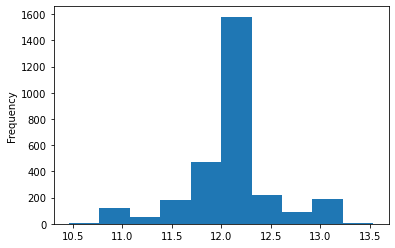

In [247]:
data_log1p_dummies_sp_df[col].plot.hist()

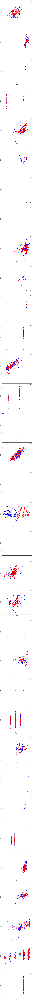

In [248]:
cols = np.intersect1d(data_log1p_dummies_sp_df.columns, data_df.columns)
i1 = 0
i2 = len(cols)
fig, axes = plt.subplots(len(cols[i1:i2]), 1, figsize=(15,15*(i2-i1)))
for i, c in enumerate(cols[i1:i2]):
    data_log1p_dummies_sp_train_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90, color='blue', label='train')
    data_log1p_dummies_sp_test_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90, color='red', label='test')

### Submission

In [249]:
submission_df = data_log1p_dummies_sp_test_df.get(['Id', col])
submission_df.shape

(1459, 2)

In [250]:
submission_df[col] = np.expm1(submission_df[col])

In [251]:
submission_df.head()

,Id,SalePrice
1460,1461,124554.275251
1461,1462,153833.765634
1462,1463,194342.565951
1463,1464,201505.758633
1464,1465,190911.278776


In [252]:
submission_df.to_csv('./submission.csv', sep=',', index=False)